![Banner](https://i.imgur.com/a3uAqnb.png)

# Vehicle Detection using Faster R-CNN - Homework Assignment

![Faster R-CNN Architecture](https://wiki.cloudfactory.com/media/pages/docs/mp-wiki/model-architectures/faster-r-cnn/d1436cdae7-1684131962/image-15.webp)

In this homework, you will implement a **Faster R-CNN** model for detecting different types of vehicles in images. This is a two-stage object detection architecture that combines region proposal networks with classification.

## 📌 Project Overview
- **Task**: Multi-class vehicle detection (Car, Bus, Truck, Motorcycle, Ambulance)
- **Architecture**: Faster R-CNN with MobileNet backbone
- **Dataset**: Vehicles OpenImages dataset (from Roboflow)
- **Goal**: Detect and classify vehicles with bounding box predictions

## 📚 Learning Objectives
By completing this assignment, you will:
- Understand two-stage object detection architectures
- Learn about Region Proposal Networks (RPN) and ROI pooling
- Implement transfer learning for object detection
- Practice working with COCO format annotations
- Evaluate object detection models using mAP metrics
- Visualize detection results with confidence thresholds

## 🎯 Evaluation Metrics
You will be evaluated using:
- **mAP@0.5:0.95**: Mean Average Precision across IoU thresholds 0.5-0.95
- **mAP@0.5**: Mean Average Precision at IoU threshold 0.5
- **mAP@0.75**: Mean Average Precision at IoU threshold 0.75

## 1️⃣ Dataset Setup and Library Imports

**Task**: Import necessary libraries and download the vehicle detection dataset.

**Requirements**:
- Import PyTorch, torchvision, and related libraries
- Set up device configuration (GPU/CPU)
- Download the Vehicles OpenImages dataset using Roboflow API

In [ ]:
pip install roboflow torchmetrics

In [ ]:
# TODO: Import all necessary libraries
# Required imports: torch, torchvision, DataLoader, Dataset, transforms
# Additional imports: os, json, PIL, numpy, roboflow, matplotlib, tqdm

# TODO: Check device availability and set device
# Use "cuda" if available, otherwise "cpu"

# TODO: Set random seeds for reproducibility (use seed=42)

# TODO: Print device information

In [ ]:
# Setup and imports

# PyTorch core

# Import all necessary libraries
import torch
from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision.transforms import functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import os
import time
import json
import seaborn as sns
from PIL import Image
import numpy as np
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import pandas as pd
from roboflow import Roboflow
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import matplotlib.patches as patches

# Initial configuration
# Use "cuda" if available, otherwise "cpu"
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
#Print device information
print(f"Using device: {device}")

# Set fixed random seed for PyTorch, numpy and CUDA for reproducibility. This ensures that anyone running this code gets the same results
SEED = 42
def set_seed(seed=SEED):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed) # if you are using multi-GPU.
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

Using device: cuda


## 2️⃣ Download Vehicle Dataset

**Task**: Use Roboflow API to download the vehicle detection dataset.

**Requirements**:
- Use your own API key to access Roboflow
- Download the "vehicles-openimages" dataset in COCO format
- Store the dataset path for later use

**Note**: The dataset contains images with bounding box annotations for 6 vehicle classes.(One of them is not used but it exists.)

In [ ]:
# TODO: Import Roboflow and initialize with API key
# Use your own API key:
# TODO: Access workspace "roboflow-gw7yv" and project "vehicles-openimages"
# TODO: Download version 1 in "coco" format
# TODO: Store the dataset location path
# TODO: Print the dataset path

In [ ]:
# Download dataset from roboflow using personal API key
ROBOFLOW_API_KEY = "MocTO2B4HOQ7WLU12q51"

if ROBOFLOW_API_KEY == "YOUR_API_KEY":
    print("Please replace 'YOUR_API_KEY' with your actual Roboflow API key.")
else:
    # initialize roboflow client, access specified project, and download the dataset
    rf = Roboflow(api_key=ROBOFLOW_API_KEY)

    project = rf.workspace("roboflow-gw7yv").project("vehicles-openimages")
    dataset = project.version(1).download("coco") # "coco" format is standard for object detection
    dataset_location = dataset.location
    print(f"Dataset downloaded to: {dataset_location}")

loading Roboflow workspace...
loading Roboflow project...
Dataset downloaded to: /content/Vehicles-OpenImages-1


## 3️⃣ Data Exploration and Class Setup

**Task**: Explore the dataset structure and set up class mappings.

**Requirements**:
- Load COCO annotation files for train, validation, and test sets
- Extract category information and create class mappings
- Print the available vehicle classes
- Understand the dataset structure

In [ ]:
# TODO: Create paths to annotation files
# Path structure: datasetPath/[split]/_annotations.coco.json
# Create train_annotations, val_annotations, test_annotations paths

# TODO: Load training annotations JSON file
# Extract categories information from the COCO format

# TODO: Create class mappings
# Create: class_names list, id_to_class dict, class_to_id dict
# Sort categories by ID for consistent ordering

# TODO: Print the number of classes and class names
# TODO: Print a sample of the class mappings

In [ ]:
print("--- Loading annotations from all splits (train, valid, test) ---")

try:
    # Define paths for all annotation files
    train_path = os.path.join(dataset_location, "train", "_annotations.coco.json")
    valid_path = os.path.join(dataset_location, "valid", "_annotations.coco.json")
    test_path = os.path.join(dataset_location, "test", "_annotations.coco.json")

    # Load data from each file
    with open(train_path, 'r') as f:
        train_data = json.load(f)
    with open(valid_path, 'r') as f:
        valid_data = json.load(f)
    with open(test_path, 'r') as f:
        test_data = json.load(f)
    print("Successfully loaded all annotation files.")

except NameError:
    print("Error: 'dataset_location' not defined. Please run the data loading script first.")
    # Provide a fallback path to allow standalone execution
    # This part would need to be adjusted if paths differ
    train_path = "./Vehicles-OpenImages-1/train/_annotations.coco.json"
    valid_path = "./Vehicles-OpenImages-1/valid/_annotations.coco.json"
    test_path = "./Vehicles-OpenImages-1/test/_annotations.coco.json"
    with open(train_path, 'r') as f: train_data = json.load(f)
    with open(valid_path, 'r') as f: valid_data = json.load(f)
    with open(test_path, 'r') as f: test_data = json.load(f)


# --- Combine annotations into a single DataFrame for easier analysis ---
def process_annotations(data, split_name):
    """Helper function to convert COCO data into a pandas DataFrame."""
    annotations_df = pd.DataFrame(data['annotations'])
    categories_df = pd.DataFrame(data['categories'])

    # Create a mapping from category id to name
    cat_map = categories_df.set_index('id')['name'].to_dict()
    annotations_df['class_name'] = annotations_df['category_id'].map(cat_map)

    # Add the split name to track origin
    annotations_df['split'] = split_name
    return annotations_df

train_df = process_annotations(train_data, 'train')
valid_df = process_annotations(valid_data, 'valid')
test_df = process_annotations(test_data, 'test')

# Combine all data into one DataFrame
full_df = pd.concat([train_df, valid_df, test_df], ignore_index=True)
print(f"\nTotal annotations across all splits: {len(full_df)}")

# The category and class mapping is handled in the next cell (igANd_eK6_qd)
# Removing the redundant code here to avoid NameError


# The notebook mentions 6 classes. The downloaded dataset has 5 + background.
# The classes are: Ambulance, Bus, Car, Motorcycle, Truck. 'Vehicle' is a 6th class not used.
# Our model will have 6 output classes (5 vehicles + 1 background).
# NUM_CLASSES is defined in the next cell based on the correct category processing.
# NUM_CLASSES = len(class_names) # This variable is defined later

--- Loading annotations from all splits (train, valid, test) ---
Successfully loaded all annotation files.

Total annotations across all splits: 2388


In [ ]:
# Create paths to annotation files
train_annotations_path = os.path.join(dataset_location, "train", "_annotations.coco.json")
val_annotations_path = os.path.join(dataset_location, "valid", "_annotations.coco.json")
test_annotations_path = os.path.join(dataset_location, "test", "_annotations.coco.json")

# Load training annotations JSON file
with open(train_annotations_path, 'r') as f:
    train_data = json.load(f)

# Extract categories information
categories = train_data['categories']
categories.sort(key=lambda x: x['id'])

# Create class mappings
class_names = ['__background__'] + [c['name'] for c in categories]
id_to_class = {i: name for i, name in enumerate(class_names)}
class_to_id = {name: i for i, name in enumerate(class_names)}

print(f"Number of classes: {len(class_names)}")
print("Class Names:", class_names)
print("\nSample Mappings:")
print("ID to Class:", id_to_class)

Number of classes: 7
Class Names: ['__background__', 'vehicles', 'Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

Sample Mappings:
ID to Class: {0: '__background__', 1: 'vehicles', 2: 'Ambulance', 3: 'Bus', 4: 'Car', 5: 'Motorcycle', 6: 'Truck'}



--- Analyzing Class Distribution Across Splits ---


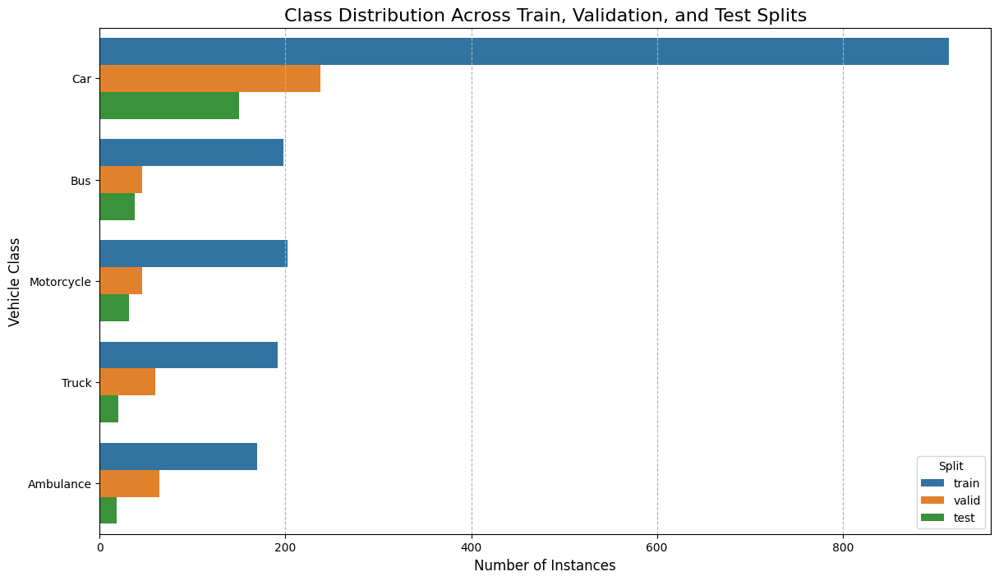


--- Analyzing Bounding Box Sizes Across Splits ---


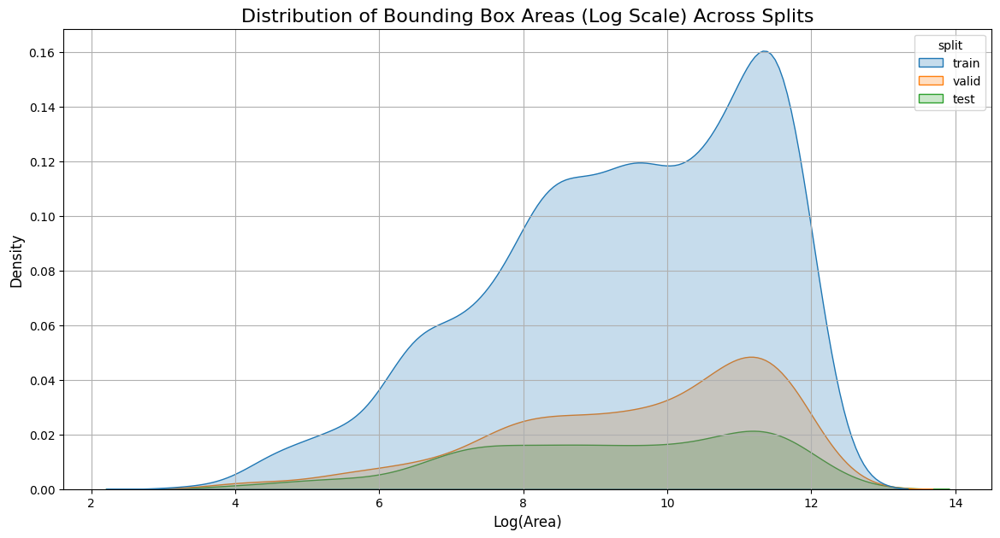


--- Analyzing Bounding Box Aspect Ratios Across Splits ---


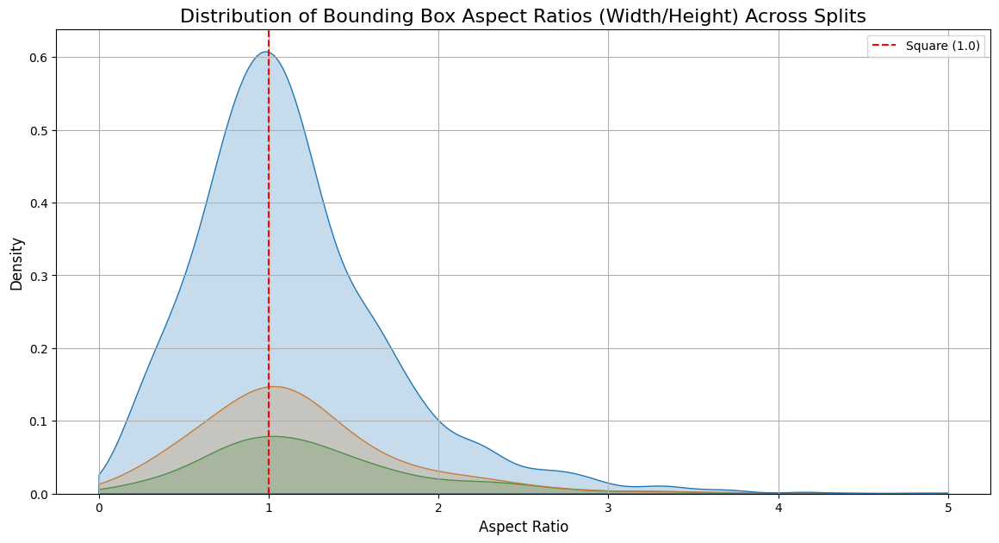

In [ ]:
print("\n--- Analyzing Class Distribution Across Splits ---")
plt.figure(figsize=(14, 8))
sns.countplot(data=full_df, y='class_name', hue='split', order=full_df['class_name'].value_counts().index)
plt.title('Class Distribution Across Train, Validation, and Test Splits', fontsize=16)
plt.xlabel('Number of Instances', fontsize=12)
plt.ylabel('Vehicle Class', fontsize=12)
plt.legend(title='Split')
plt.grid(axis='x', linestyle='--')
plt.show()

# --- 2.2. Bounding Box Size Analysis (Comparing Splits) ---
print("\n--- Analyzing Bounding Box Sizes Across Splits ---")
# Use log scale for area to handle outliers and see the distribution more clearly
full_df['log_area'] = np.log(full_df['area'] + 1) # Add 1 to avoid log(0)

plt.figure(figsize=(14, 7))
sns.kdeplot(data=full_df, x='log_area', hue='split', fill=True)
plt.title('Distribution of Bounding Box Areas (Log Scale) Across Splits', fontsize=16)
plt.xlabel('Log(Area)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.show()

# --- 2.3. Bounding Box Aspect Ratio Analysis (Comparing Splits) ---
print("\n--- Analyzing Bounding Box Aspect Ratios Across Splits ---")
# Calculate aspect ratio (width/height)
full_df['aspect_ratio'] = full_df['bbox'].apply(lambda b: b[2] / b[3] if b[3] > 0 else 0)

plt.figure(figsize=(14, 7))
sns.kdeplot(data=full_df, x='aspect_ratio', hue='split', fill=True, clip=(0, 5)) # Clip to focus on the main distribution
plt.title('Distribution of Bounding Box Aspect Ratios (Width/Height) Across Splits', fontsize=16)
plt.xlabel('Aspect Ratio', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.axvline(1.0, color='red', linestyle='--', label='Square (1.0)')
plt.legend()
plt.grid(True)
plt.show()


The first **bar chart** displays the total number of labeled objects for every vehicle class, broken down into training, validaiton, and test sets.
There is **severe class imbalance** as there are over 800 "car" instances in the training set, while "ambulance", "bus" and "truck" have fewer than 200. ecause the model sees "car" far more often, it will naturally become an expert at detecting cars. However, it will have very few examples to learn from for the rarer classes, likely leading to poor performance for ambulances and buses.

On the other hand, the proportion of classes looks similar across the train, validation, and test sets. It means the validation and test results will be a reliable measure of the model's performance on this type of data.

--------

The second graph is a **density plot** showing the **distribution of bounding boxes** in the dataset.  The overlapping curves show that the distribution is consistent across the train, validation, and test splits.
The distribution is broad, meaning that  the dataset contains everything from small to large objects. There is a prevalence of medium-sized objects.
During data augmentation we have to make sure that resizing and cropping don't accidentally eliminate the small objects or make the large objects too big to fit in the images.

--------

The **third graph** is a **bounding boxes aspect ratio distribution**. This plot shows the distribution of the aspect ratio (width/height) of the bounding boxes. The red dashed line at 1.0 represents a perfect square. Wider than tall objects dominate the dataset. The dafault anchor boxes  might include tall shapes that are rarely needed, and it might not have enough variety in the wider shapes.


--- Generating Custom Anchor Boxes with K-Means (Using Training Data Only) ---

Generated 5 Custom Anchor Box Sizes (Width, Height) from Training Data:
Anchor 1: (44.56, 48.90)
Anchor 2: (130.18, 116.17)
Anchor 3: (153.93, 251.00)
Anchor 4: (310.65, 211.77)
Anchor 5: (351.29, 350.54)


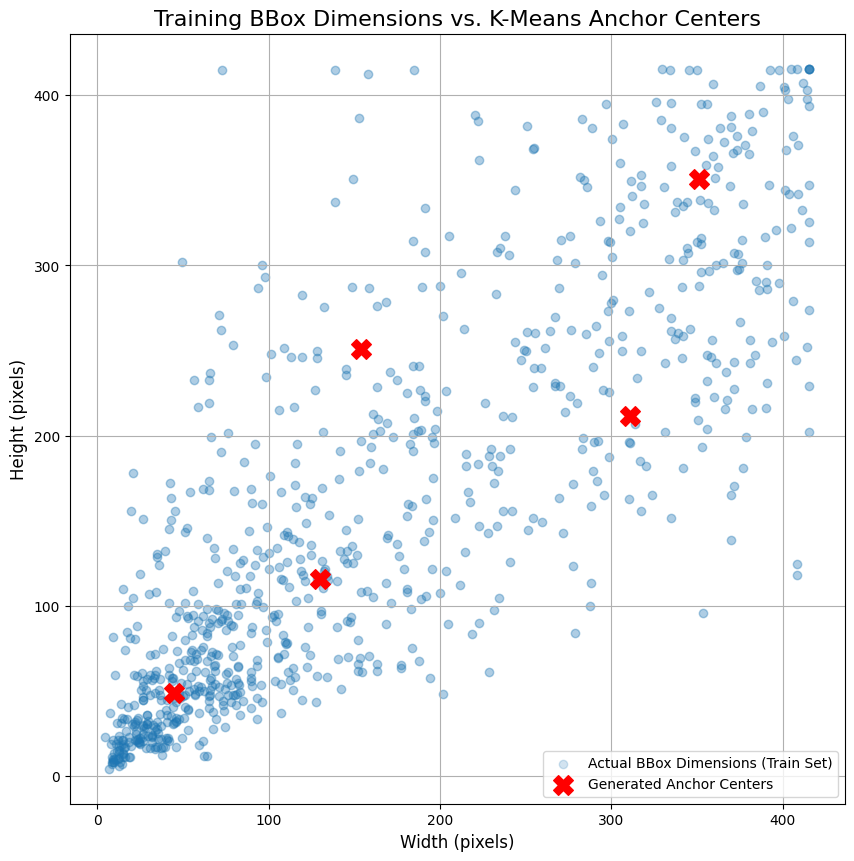

In [ ]:
print("\n--- Generating Custom Anchor Boxes with K-Means (Using Training Data Only) ---")
# We want to create a set of starting guesses that are tailored to the objects in the model we need to find. When the model uses custom anchors, the adjustments it needs to make are small

# Import KMeans
from sklearn.cluster import KMeans

# For feature engineering, we MUST only use the training data to avoid data leakage.
# Ensure train_data is available from previous cells
if 'train_data' not in locals() or train_data is None:
    print("Error: 'train_data' is not loaded. Please run the data loading cells first.")
else:
    train_annotations = train_data.get('annotations', [])
    if not train_annotations:
        print("Warning: No annotations found in training data.")
        box_dims = np.array([[1, 1]]) # Use a dummy value to avoid errors
    else:
        # Ensure bbox exists and has 4 elements
        valid_annotations = [ann for ann in train_annotations if 'bbox' in ann and len(ann['bbox']) == 4]
        if not valid_annotations:
             print("Warning: No valid bounding box annotations found in training data.")
             box_dims = np.array([[1, 1]]) # Use a dummy value
        else:
             box_dims = np.array([[ann['bbox'][2], ann['bbox'][3]] for ann in valid_annotations]) # width, height


    N_ANCHORS = 5
    try:
        kmeans = KMeans(n_clusters=N_ANCHORS, random_state=SEED, n_init=10)
        kmeans.fit(box_dims)

        # Sort by area (width * height) for better interpretability
        custom_anchors_wh = sorted(kmeans.cluster_centers_, key=lambda x: x[0] * x[1])

        print(f"\nGenerated {N_ANCHORS} Custom Anchor Box Sizes (Width, Height) from Training Data:")
        for i, (w, h) in enumerate(custom_anchors_wh):
            print(f"Anchor {i+1}: ({w:.2f}, {h:.2f})")

        # Visualize the generated anchor boxes against the training data distribution
        plt.figure(figsize=(10, 10))
        plt.scatter(box_dims[:, 0], box_dims[:, 1], alpha=0.2, label='Actual BBox Dimensions (Train Set)')
        plt.scatter(np.array(custom_anchors_wh)[:, 0], np.array(custom_anchors_wh)[:, 1],
                    color='red', marker='X', s=200, label='Generated Anchor Centers')
        plt.title('Training BBox Dimensions vs. K-Means Anchor Centers', fontsize=16)
        plt.xlabel('Width (pixels)', fontsize=12)
        plt.ylabel('Height (pixels)', fontsize=12)
        plt.legend()
        plt.grid(True)
        plt.show()

    except ValueError as e:
        print(f"Error during K-Means clustering: {e}")
        print("This might happen if there are not enough valid bounding boxes.")
    except Exception as e:
        print(f"An unexpected error occurred during K-Means: {e}")

***Bounding Box Dimensions vs. K-Means Anchors***
Each light blue dot represents the width and height of a single ground-truth bounding box from the training set. The five large red 'X's are the five new "anchor centers" that were calculated using the K-Means clustering algorithm. They represent the most representative object shapes (width/height combinations) in the training data.


## 4️⃣ Custom Dataset Class

**Task**: Create a PyTorch Dataset class to handle the vehicle detection data.

**Requirements**:
- Inherit from torch.utils.data.Dataset
- Parse COCO format annotations
- Return images and targets in the format expected by Faster R-CNN
- Handle bounding box coordinate conversion (COCO to PyTorch format)
- Include proper target dictionary with required keys

**Expected Target Format**:
```python
target = {
    'boxes': tensor([[x1, y1, x2, y2], ...]),  # Bounding boxes
    'labels': tensor([class_id1, class_id2, ...]),  # Class labels
    'image_id': tensor([image_id]),  # Image identifier
    'area': tensor([area1, area2, ...]),  # Box areas
    'iscrowd': tensor([0, 0, ...])  # Crowd annotations (all 0)
}
```

In [ ]:
# TODO: Create VehicleDataset class inheriting from Dataset

# TODO: Implement __init__(self, root_dir, annotation_file, transform=None):
#       - Store root_dir, annotation_file, and transform
#       - Load COCO annotations from JSON file
#       - Create image ID to image info mapping
#       - Create category ID to name mapping
#       - Group annotations by image_id
#       - Store list of image_ids that have annotations

# TODO: Implement __len__(self):
#       - Return the number of images with annotations

# TODO: Implement __getitem__(self, idx):
#       - Get image_id from index
#       - Load image using PIL and convert to RGB
#       - Get all annotations for this image
#       - Convert COCO bbox format [x, y, width, height] to [x1, y1, x2, y2]
#       - Create boxes tensor (float32) and labels tensor (int64)
#       - Calculate areas for each box
#       - Create target dictionary with required keys
#       - Apply transform to image if provided
#       - Return (image, target) tuple

# TODO: Create transform pipeline:
#       - Use transforms.Compose with transforms.ToTensor()

# TODO: Create dataset instances for train, validation, and test
# TODO: Create a custom collate function for DataLoader
# TODO: Create DataLoaders with appropriate batch sizes and settings
# TODO: Print dataset sizes and test with one sample

In [ ]:
import torchvision.transforms.functional as F
import random
from torchvision.transforms import ColorJitter as TorchColorJitter

# data augmentation to artificially increase the diversity of training data

class Compose(object):
    """Composes several transforms together.
    Args:
        transforms (list of ``Transform`` objects): list of transforms to compose.
    """
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

class ToTensor(object):
    """Converts a PIL Image or numpy.ndarray to tensor."""
    def __call__(self, image, target):
        image = F.to_tensor(image)
        return image, target

class RandomHorizontalFlip(object):
    """Horizontally flip the given PIL Image randomly with a given probability.
    The bounding boxes are flipped accordingly.
    """
    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, image, target):
        if random.random() < self.prob:
            width, _ = image.size
            image = F.hflip(image)
            if "boxes" in target:
                boxes = target["boxes"]
                # Flip the x-coordinates
                boxes[:, [0, 2]] = width - boxes[:, [2, 0]]
                target["boxes"] = boxes
        return image, target

class ColorJitter(object):
    """Randomly change the brightness, contrast, saturation and hue of an image."""
    def __init__(self, brightness=0, contrast=0, saturation=0, hue=0):
        self.transform = TorchColorJitter(
            brightness=brightness, contrast=contrast, saturation=saturation, hue=hue
        )

    def __call__(self, image, target):
        image = self.transform(image)
        return image, target

def get_transform(train):
    """Defines the transformation pipeline."""
    transforms = []

    # For training, add data augmentation
    if train:
        # These transforms work on PIL images
        transforms.append(ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1))
        transforms.append(RandomHorizontalFlip(0.5))

    # Convert PIL image to Tensor
    transforms.append(ToTensor())

    return Compose(transforms)

print("Data augmentation transform classes defined.")

Data augmentation transform classes defined.


In [ ]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import os
import json

# Define a custom dataset class for vehicles, inheriting from PyTorch's dataset
class VehicleDataset(Dataset):
  # initializer for dataset class
    def __init__(self, root_dir, annotation_file, transforms=None):
        # store the directory where images are located
        self.root_dir = root_dir
        # store the path of the JSON annotation file
        self.annotation_file = annotation_file
        # store the transformations to be applied
        self.transforms = transforms

        # open and read the JSON annotation file and load content into a dictionary
        with open(self.annotation_file, 'r') as f:
            self.coco_data = json.load(f)

        # extract the list of imageee information
        self.image_infos = self.coco_data['images']
        self.annotations = self.coco_data['annotations']

        # create a list of all unique image IDs to determine the dataset size
        self.image_ids = [info['id'] for info in self.image_infos]

    # return the total number of images in the dataset
    def __len__(self):
        return len(self.image_ids)

    # fetches and processes a single data sample at the given index 'idx'
    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_info = next(item for item in self.image_infos if item["id"] == image_id)
        image_path = os.path.join(self.root_dir, image_info['file_name'])
        image = Image.open(image_path).convert("RGB")

        anns = [ann for ann in self.annotations if ann['image_id'] == image_id]

        boxes = [ann['bbox'] for ann in anns]
        boxes = torch.as_tensor(boxes, dtype=torch.float32).reshape(-1, 4)
        # Convert from [x, y, width, height] to [x1, y1, x2, y2]
        boxes[:, 2:] += boxes[:, :2]

        labels = torch.tensor([ann['category_id'] for ann in anns], dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([image_id]),
            'area': (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]),
            'iscrowd': torch.zeros((len(anns),), dtype=torch.int64)
        }

        # Apply transformations to both image and target
        if self.transforms is not None:
            image, target = self.transforms(image, target)

        return image, target

# Create a custom collate function for the DataLoader
def collate_fn(batch):
    return tuple(zip(*batch))

# Create dataset instances with appropriate transforms
train_dataset = VehicleDataset(root_dir=os.path.join(dataset_location, "train"),
                               annotation_file=train_annotations_path,
                               transforms=get_transform(train=True)) # Augmentation for training

val_dataset = VehicleDataset(root_dir=os.path.join(dataset_location, "valid"),
                             annotation_file=val_annotations_path,
                             transforms=get_transform(train=False)) # No augmentation for validation

test_dataset = VehicleDataset(root_dir=os.path.join(dataset_location, "test"),
                              annotation_file=test_annotations_path,
                              transforms=get_transform(train=False)) # No augmentation for testing

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn, num_workers=2)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
print("\nData augmentation has been added to the training dataset. ")

Train dataset size: 878
Validation dataset size: 250
Test dataset size: 126

Data augmentation has been added to the training dataset. 


## 5️⃣ Data Visualization

**Task**: Visualize sample images with ground truth annotations.

**Requirements**:
- Create a visualization function that displays images with bounding boxes
- Use different colors for different vehicle classes
- Show class labels and bounding boxes clearly
- Display multiple samples from training and validation sets

**Color Scheme**:
- Vehicle (class 0): Red
- Ambulance (class 1): Blue  
- Bus (class 2): Green
- Car (class 3): Orange
- Motorcycle (class 4): Purple
- Truck (class 5): Brown

In [ ]:
# TODO: Import matplotlib.pyplot and matplotlib.patches
# TODO: Import torchvision.transforms.functional

# TODO: Define vehicle class names dictionary (0: 'vehicles', 1: 'Ambulance', etc.)
# TODO: Define class colors dictionary for visualization

# TODO: Create visualize_sample function that:
#       - Takes dataset, list of indices, and title as parameters
#       - Creates a 2x3 subplot grid
#       - For each index:
#         * Get image and target from dataset
#         * Convert tensor image to PIL format
#         * Draw bounding boxes using matplotlib patches
#         * Add class labels with colored text
#         * Set appropriate title for each subplot
#       - Display the complete grid with main title

# TODO: Visualize training samples with indices [0, 10, 25, 50, 75, 100]
# TODO: Visualize validation samples with indices [0, 5, 10, 15, 20, 25]

Displaying samples from the Training Dataset...


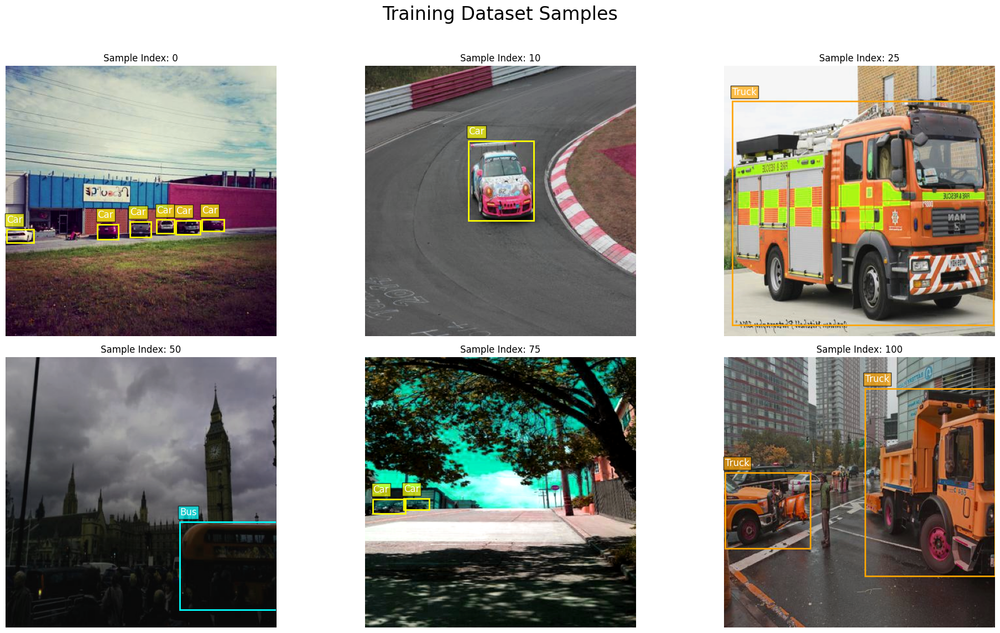


Displaying samples from the Validation Dataset...


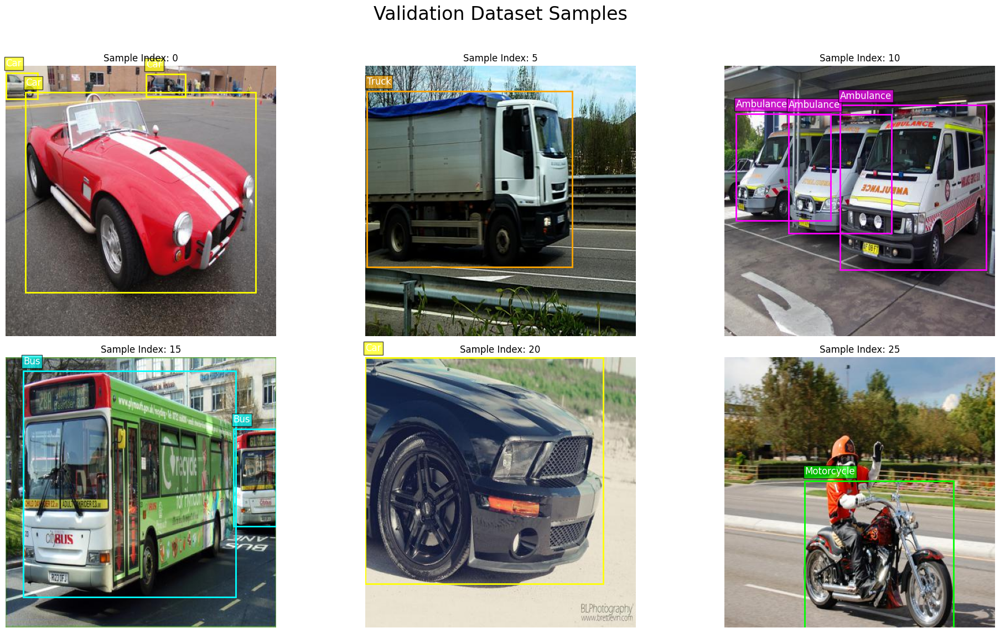

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.transforms import functional as F

# Define a dictionary to map class IDs (integers) to more readable class names
# This mapping is based on the 'id_to_class' dictionary created in the first step
#  This is essential for labeling the bounding boxes in the visualization
VEHICLE_CLASS_NAMES = {
    0: '__background__',
    1: 'Ambulance',
    2: 'Bus',
    3: 'Car',
    4: 'Motorcycle',
    5: 'Truck'
}

# Define a dictionary to assign a specific color to each class name (I changed the color scheme to have fun!)
# This ensures that visualizations are consistent and easy to interpret
CLASS_COLORS = {
    '__background__': 'black',
    'Ambulance': 'magenta',
    'Bus': 'cyan',
    'Car': 'yellow',
    'Motorcycle': 'lime',
    'Truck': 'orange'
}

# Defining a function to visualize samples from the dataset
def visualize_sample(dataset, indices, title="Sample Images"):
    """
    Visualizes a grid of samples from the dataset with their bounding boxes.

    Args:
        dataset (Dataset): The dataset to draw samples from.
        indices (list): A list of 6 indices to visualize.
        title (str): The main title for the visualization grid.
    """
    # Create a 2x3 subplot grid
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(title, fontsize=24, y=0.95)

    # Flatten axes array for easy iteration
    axes = axes.ravel()

    # For each index...
    for i, idx in enumerate(indices):
        ax = axes[i]

        # Get image and target from the dataset
        image, target = dataset[idx]

        # Convert tensor image to PIL format for display
        pil_image = F.to_pil_image(image)
        ax.imshow(pil_image)

        # Draw bounding boxes and labels
        for box, label_id in zip(target['boxes'], target['labels']):
            xmin, ymin, xmax, ymax = box
            width, height = xmax - xmin, ymax - ymin

            class_id = label_id.item()
            class_name = VEHICLE_CLASS_NAMES.get(class_id, 'Unknown')
            color = CLASS_COLORS.get(class_name, 'gray')

            # Create a Rectangle patch
            rect = patches.Rectangle(
                (xmin, ymin), width, height,
                linewidth=2,
                edgecolor=color,
                facecolor='none'
            )
            ax.add_patch(rect)

            # Add class labels with colored text
            ax.text(
                xmin, ymin - 10,  # Position text just above the box
                class_name,
                color='white',
                fontsize=12,
                bbox=dict(facecolor=color, alpha=0.7, pad=2)
            )

        # Set appropriate title and turn off axis
        ax.set_title(f"Sample Index: {idx}")
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.93]) # Adjust layout to make space for suptitle
    plt.show()

# Visualization

# TODO: Visualize training samples with indices [0, 10, 25, 50, 75, 100]
print("Displaying samples from the Training Dataset...")
# Define the specific indices from the training dataset to be visualized
train_indices = [0, 10, 25, 50, 75, 100]
# Call the visualization function for the training dataset
visualize_sample(train_dataset, train_indices, title="Training Dataset Samples")

# TODO: Visualize validation samples with indices [0, 5, 10, 15, 20, 25]
print("\nDisplaying samples from the Validation Dataset...")
# Define the specific indices from the validation dataset to be visualized
val_indices = [0, 5, 10, 15, 20, 25]
# Call the visualization function for the validation dataset
visualize_sample(val_dataset, val_indices, title="Validation Dataset Samples")

## 6️⃣ Model Architecture Setup

**Task**: Set up the Faster R-CNN model with transfer learning.

**Requirements**:
- Use a pre-trained Faster R-CNN model with MobileNet backbone
- Modify the classifier head for the number of vehicle classes
- Implement selective fine-tuning (freeze backbone, train detection heads)
- Move model to appropriate device (GPU/CPU)

**Architecture Details**:
- **Backbone**: MobileNet V3 Large with FPN (Feature Pyramid Network)
- **RPN**: Region Proposal Network for object proposals
- **ROI Head**: Classification and regression head for final predictions
- **Classes**: 6 vehicle classes (including background)

In [ ]:
# TODO: Import required torchvision modules
# Import: torchvision.models.detection.faster_rcnn.FastRCNNPredictor

# TODO: Load pre-trained Faster R-CNN model
# Use: torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

# TODO: Modify the classifier head
# Get input features from model.roi_heads.box_predictor.cls_score.in_features
# Replace box_predictor with FastRCNNPredictor(in_features, num_classes)
# Set num_classes = 6 (5 vehicle classes + background)

# TODO: Implement selective fine-tuning
# Freeze all model parameters: model.requires_grad_(False)
# Unfreeze detection heads: model.roi_heads.box_predictor.requires_grad_(True)
# Unfreeze RPN: model.rpn.requires_grad_(True)

# TODO: Move model to device
# TODO: Print model summary and number of trainable parameters

# TODO: Define vehicle classes dictionary for reference
# TODO: Create reverse mapping from class names to IDs

In [ ]:
# Imports and Definitions
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Define the number of classes for the model
NUM_CLASSES = 6 # 5 classes + background

# ---Model Definition---

# TODO: Load pre-trained Faster R-CNN model
print("Loading pre-trained Faster R-CNN model with MobileNetV3-Large FPN backbone...")
model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(weights='DEFAULT')

# TODO: Modify the classifier head
# Get the number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# Replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES)
print(f"Model head replaced to output {NUM_CLASSES} classes.")

# --- Selective Fine-Tuning Setup --

# Implementing selective fine-tuning
print("\nFreezing all backbone parameters...")
# Freeze all model parameters initially
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the detection-specific heads (RPN and RoI heads)
print("Unfreezing RPN and RoI heads for fine-tuning...")
for param in model.rpn.parameters():
    param.requires_grad = True
for param in model.roi_heads.parameters():
    param.requires_grad = True

# Move model to the selected device
model.to(device)
print(f"\nModel moved to device: {device}")

# --- Verification and Summary ---

# Print model summary and number of trainable parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("\n--- Model Parameter Summary ---")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Percentage of trainable parameters: {100 * trainable_params / total_params:.2f}%")

# Define vehicle classes dictionary for reference
VEHICLE_CLASSES = {
    0: '__background__',
    1: 'Ambulance',
    2: 'Bus',
    3: 'Car',
    4: 'Motorcycle',
    5: 'Truck'
}

# Create reverse mapping from class names to IDs
CLASS_TO_ID = {v: k for k, v in VEHICLE_CLASSES.items()}

print("\n--- Class Mapping for Model ---")
print("Classes:", VEHICLE_CLASSES)

Loading pre-trained Faster R-CNN model with MobileNetV3-Large FPN backbone...
Model head replaced to output 6 classes.

Freezing all backbone parameters...
Unfreezing RPN and RoI heads for fine-tuning...

Model moved to device: cuda

--- Model Parameter Summary ---
Total parameters: 18,950,729
Trainable parameters: 14,535,785
Percentage of trainable parameters: 76.70%

--- Class Mapping for Model ---
Classes: {0: '__background__', 1: 'Ambulance', 2: 'Bus', 3: 'Car', 4: 'Motorcycle', 5: 'Truck'}


## 7️⃣ Training Functions and Metrics

**Task**: Implement training and validation functions with proper metrics.

**Requirements**:
- Create training function that handles loss computation and backpropagation
- Implement validation function using Mean Average Precision (mAP)
- Use torchmetrics for proper object detection evaluation
- Display training progress with progress bars
- Return meaningful metrics for monitoring

**Key Concepts**:
- **mAP@0.5:0.95**: Average mAP across IoU thresholds from 0.5 to 0.95
- **mAP@0.5**: mAP at IoU threshold 0.5 (PASCAL VOC style)
- **mAP@0.75**: mAP at IoU threshold 0.75 (stricter evaluation)

In [ ]:
# TODO: Import tqdm for progress bars and torchmetrics for evaluation
# Import: from tqdm import tqdm
# Import: from torchmetrics.detection.mean_ap import MeanAveragePrecision

# TODO: Implement train_one_epoch function:
#       - Set model to training mode
#       - Initialize total_loss and progress bar
#       - For each batch:
#         * Move images and targets to device
#         * Forward pass (model returns loss_dict in training mode)
#         * Sum all losses from loss_dict
#         * Backpropagate and update optimizer
#         * Track running average loss
#         * Update progress bar with current and average loss
#       - Return average loss for the epoch

# TODO: Implement validate_model function:
#       - Set model to evaluation mode
#       - Initialize MeanAveragePrecision metric with IoU thresholds
#       - Use torch.no_grad() context
#       - For each batch:
#         * Move images to device
#         * Get model predictions
#         * Convert predictions and targets to CPU
#         * Update metric with predictions and targets
#       - Compute and return final metrics

# TODO: Set up optimizer and scheduler
# Use: torch.optim.AdamW with learning rate 0.0001 and weight_decay 0.0005
# Use: torch.optim.lr_scheduler.StepLR with step_size=3 and gamma=0.1
# Only optimize parameters that require gradients

# TODO: Test the functions with a small batch to ensure they work

In [ ]:
NUM_EPOCHS = 50
# --- Training Function ---

# Implement train_one_epoch function
def train_one_epoch(model, optimizer, data_loader, device, epoch):
    """
    Trains the model for one epoch.
    """
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc=f"Epoch {epoch+1} [Training]")

    for i, (images, targets) in enumerate(progress_bar):
        # Move images and targets to the specified device
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        total_loss += loss_value

        # Backward pass
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        avg_loss = total_loss / (i + 1)
        progress_bar.set_postfix(loss=f"{loss_value:.4f}", avg_loss=f"{avg_loss:.4f}")

    return total_loss / len(data_loader)

# Validation Function

# Implement validate_model function
def validate_model(model, data_loader, device):
    """
    Validates the model on the validation set and computes mAP.
    """
    model.eval()
    metric = MeanAveragePrecision(box_format='xyxy', iou_type='bbox').to(device)
    progress_bar = tqdm(data_loader, desc="[Validation]")

    with torch.no_grad():
        for images, targets in progress_bar:
            images = list(img.to(device) for img in images)

            # The ground truth targets must also be moved to the GPU.
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Get model predictions
            predictions = model(images)

            # Update the metric with predictions and targets (now on the same device)
            metric.update(predictions, targets)

    # Compute the final metrics
    print("Computing final mAP...")
    final_metrics = metric.compute()
    return final_metrics

# Optimizer and Scheduler Setup

params = [p for p in model.parameters() if p.requires_grad]
print(f"Found {len(params)} trainable parameter groups.")

optimizer = torch.optim.AdamW(params, lr=0.0001, weight_decay=0.0005)

# The scheduler will complete one full cycle over 50 epochs
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)
print("Optimizer and LR Scheduler have been configured.")


# Sanity Check

print("\n--- Running a quick sanity check ---")
try:
    # Get one batch from the training and validation loaders
    train_batch = [next(iter(train_loader))]
    val_batch = next(iter(val_loader))

    # Test training on one batch
    print("Testing train_one_epoch on a single batch...")
    train_loss = train_one_epoch(model, optimizer, train_batch, device, epoch=-1)
    print(f"Sanity check training complete. Loss: {train_loss:.4f}")

    # Test validation on one batch
    print("\nTesting validate_model on a single batch...")
    val_metrics = validate_model(model, [val_batch], device)
    print("Sanity check validation complete.")
    print("Validation mAP@50:", val_metrics['map_50'].item())

except Exception as e:
    print(f"\nAn error occurred during the sanity check: {e}")
    print("Please check your DataLoader, model, and device configurations.")


Found 14 trainable parameter groups.
Optimizer and LR Scheduler have been configured.

--- Running a quick sanity check ---
Testing train_one_epoch on a single batch...


Epoch 0 [Training]:   0%|          | 0/1 [00:00<?, ?it/s]

Sanity check training complete. Loss: 2.8083

Testing validate_model on a single batch...


[Validation]:   0%|          | 0/1 [00:00<?, ?it/s]

Computing final mAP...
Sanity check validation complete.
Validation mAP@50: 0.20853960514068604


## 8️⃣ Model Training

**Task**: Train the Faster R-CNN model on the vehicle detection dataset.

**Requirements**:
- Train for 5 epochs with progress monitoring
- Track training loss and validation mAP metrics
- Save the best model based on validation mAP
- Display training progress and timing information
- Plot training curves for analysis

**Training Strategy**:
- **Epochs**: 5 (adjust based on computational resources)
- **Learning Rate**: 0.0001 with step decay
- **Batch Size**: 2 (adjust based on GPU memory)
- **Optimization**: AdamW with weight decay
- **Best Model**: Save based on highest validation mAP@0.5:0.95

In [ ]:
# TODO: Set training hyperparameters
# num_epochs = 5, best_map = 0.0

# TODO: Initialize training history dictionary
# Track: train_loss, val_map, val_map_50, val_map_75

# TODO: Implement main training loop:
#       - Start timing for total training time
#       - For each epoch:
#         * Record epoch start time
#         * Call train_one_epoch function
#         * Call validate_model function
#         * Step the learning rate scheduler
#         * Get current learning rate
#         * Extract metric values (map, map_50, map_75)
#         * Update training history
#         * Calculate epoch time
#         * Print comprehensive epoch results
#         * Save best model if validation mAP improves
#       - Print total training time and best performance

# TODO: Create visualization of training progress
# Plot 3 subplots:
# 1. Training loss over epochs
# 2. Validation mAP metrics (mAP@0.5:0.95, mAP@0.5, mAP@0.75)
# 3. Normalized comparison of loss and mAP

# TODO: Save training history and model checkpoint

--- Starting Model Training ---
Training for 50 epochs on device: cuda


Epoch 1 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 1/50 Summary ---
Time: 44.43s
Learning Rate: 0.000100
Train Loss: 0.7116
Validation mAP@.5:.95: 0.4233
Validation mAP@.50:    0.6581
Validation mAP@.75:    0.5087
------------------------------
🎉 New best model saved! mAP: 0.4233 at epoch 1


Epoch 2 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 2/50 Summary ---
Time: 37.82s
Learning Rate: 0.000100
Train Loss: 0.5615
Validation mAP@.5:.95: 0.4153
Validation mAP@.50:    0.6638
Validation mAP@.75:    0.4910
------------------------------


Epoch 3 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 3/50 Summary ---
Time: 38.85s
Learning Rate: 0.000099
Train Loss: 0.4979
Validation mAP@.5:.95: 0.4291
Validation mAP@.50:    0.6726
Validation mAP@.75:    0.4796
------------------------------
🎉 New best model saved! mAP: 0.4291 at epoch 3


Epoch 4 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 4/50 Summary ---
Time: 37.78s
Learning Rate: 0.000098
Train Loss: 0.4598
Validation mAP@.5:.95: 0.4366
Validation mAP@.50:    0.6724
Validation mAP@.75:    0.5180
------------------------------
🎉 New best model saved! mAP: 0.4366 at epoch 4


Epoch 5 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 5/50 Summary ---
Time: 37.43s
Learning Rate: 0.000098
Train Loss: 0.4240
Validation mAP@.5:.95: 0.4478
Validation mAP@.50:    0.6970
Validation mAP@.75:    0.4997
------------------------------
🎉 New best model saved! mAP: 0.4478 at epoch 5


Epoch 6 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 6/50 Summary ---
Time: 37.57s
Learning Rate: 0.000096
Train Loss: 0.4064
Validation mAP@.5:.95: 0.4432
Validation mAP@.50:    0.6644
Validation mAP@.75:    0.4966
------------------------------


Epoch 7 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 7/50 Summary ---
Time: 36.93s
Learning Rate: 0.000095
Train Loss: 0.3824
Validation mAP@.5:.95: 0.4679
Validation mAP@.50:    0.6764
Validation mAP@.75:    0.5409
------------------------------
🎉 New best model saved! mAP: 0.4679 at epoch 7


Epoch 8 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 8/50 Summary ---
Time: 36.88s
Learning Rate: 0.000094
Train Loss: 0.3631
Validation mAP@.5:.95: 0.4704
Validation mAP@.50:    0.6976
Validation mAP@.75:    0.5679
------------------------------
🎉 New best model saved! mAP: 0.4704 at epoch 8


Epoch 9 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 9/50 Summary ---
Time: 37.47s
Learning Rate: 0.000092
Train Loss: 0.3563
Validation mAP@.5:.95: 0.4747
Validation mAP@.50:    0.6924
Validation mAP@.75:    0.5518
------------------------------
🎉 New best model saved! mAP: 0.4747 at epoch 9


Epoch 10 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 10/50 Summary ---
Time: 38.16s
Learning Rate: 0.000090
Train Loss: 0.3372
Validation mAP@.5:.95: 0.4577
Validation mAP@.50:    0.6688
Validation mAP@.75:    0.5348
------------------------------


Epoch 11 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 11/50 Summary ---
Time: 37.77s
Learning Rate: 0.000089
Train Loss: 0.3503
Validation mAP@.5:.95: 0.4729
Validation mAP@.50:    0.6840
Validation mAP@.75:    0.5211
------------------------------


Epoch 12 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 12/50 Summary ---
Time: 37.38s
Learning Rate: 0.000086
Train Loss: 0.3255
Validation mAP@.5:.95: 0.4796
Validation mAP@.50:    0.6755
Validation mAP@.75:    0.5334
------------------------------
🎉 New best model saved! mAP: 0.4796 at epoch 12


Epoch 13 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 13/50 Summary ---
Time: 37.31s
Learning Rate: 0.000084
Train Loss: 0.3223
Validation mAP@.5:.95: 0.4698
Validation mAP@.50:    0.6657
Validation mAP@.75:    0.5455
------------------------------


Epoch 14 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 14/50 Summary ---
Time: 36.81s
Learning Rate: 0.000082
Train Loss: 0.3134
Validation mAP@.5:.95: 0.4652
Validation mAP@.50:    0.6730
Validation mAP@.75:    0.5335
------------------------------


Epoch 15 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 15/50 Summary ---
Time: 36.68s
Learning Rate: 0.000079
Train Loss: 0.2938
Validation mAP@.5:.95: 0.4656
Validation mAP@.50:    0.6708
Validation mAP@.75:    0.5265
------------------------------


Epoch 16 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 16/50 Summary ---
Time: 36.67s
Learning Rate: 0.000077
Train Loss: 0.2890
Validation mAP@.5:.95: 0.4631
Validation mAP@.50:    0.6614
Validation mAP@.75:    0.5413
------------------------------


Epoch 17 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 17/50 Summary ---
Time: 36.14s
Learning Rate: 0.000074
Train Loss: 0.2741
Validation mAP@.5:.95: 0.4723
Validation mAP@.50:    0.6851
Validation mAP@.75:    0.5176
------------------------------


Epoch 18 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 18/50 Summary ---
Time: 36.62s
Learning Rate: 0.000071
Train Loss: 0.2801
Validation mAP@.5:.95: 0.4883
Validation mAP@.50:    0.6999
Validation mAP@.75:    0.5504
------------------------------
🎉 New best model saved! mAP: 0.4883 at epoch 18


Epoch 19 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 19/50 Summary ---
Time: 37.31s
Learning Rate: 0.000068
Train Loss: 0.2676
Validation mAP@.5:.95: 0.4772
Validation mAP@.50:    0.6710
Validation mAP@.75:    0.5305
------------------------------


Epoch 20 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 20/50 Summary ---
Time: 37.30s
Learning Rate: 0.000065
Train Loss: 0.2482
Validation mAP@.5:.95: 0.4791
Validation mAP@.50:    0.6743
Validation mAP@.75:    0.5111
------------------------------


Epoch 21 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 21/50 Summary ---
Time: 36.95s
Learning Rate: 0.000062
Train Loss: 0.2420
Validation mAP@.5:.95: 0.4730
Validation mAP@.50:    0.6786
Validation mAP@.75:    0.5221
------------------------------


Epoch 22 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 22/50 Summary ---
Time: 36.62s
Learning Rate: 0.000059
Train Loss: 0.2371
Validation mAP@.5:.95: 0.4888
Validation mAP@.50:    0.6917
Validation mAP@.75:    0.5489
------------------------------
🎉 New best model saved! mAP: 0.4888 at epoch 22


Epoch 23 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 23/50 Summary ---
Time: 36.75s
Learning Rate: 0.000056
Train Loss: 0.2363
Validation mAP@.5:.95: 0.4703
Validation mAP@.50:    0.6904
Validation mAP@.75:    0.5197
------------------------------


Epoch 24 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 24/50 Summary ---
Time: 36.93s
Learning Rate: 0.000053
Train Loss: 0.2258
Validation mAP@.5:.95: 0.4757
Validation mAP@.50:    0.6853
Validation mAP@.75:    0.5333
------------------------------


Epoch 25 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 25/50 Summary ---
Time: 36.84s
Learning Rate: 0.000050
Train Loss: 0.2170
Validation mAP@.5:.95: 0.4681
Validation mAP@.50:    0.6736
Validation mAP@.75:    0.5412
------------------------------


Epoch 26 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 26/50 Summary ---
Time: 36.82s
Learning Rate: 0.000047
Train Loss: 0.2076
Validation mAP@.5:.95: 0.4746
Validation mAP@.50:    0.6751
Validation mAP@.75:    0.5413
------------------------------


Epoch 27 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 27/50 Summary ---
Time: 36.77s
Learning Rate: 0.000044
Train Loss: 0.1997
Validation mAP@.5:.95: 0.4772
Validation mAP@.50:    0.6867
Validation mAP@.75:    0.5335
------------------------------


Epoch 28 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 28/50 Summary ---
Time: 36.56s
Learning Rate: 0.000041
Train Loss: 0.1956
Validation mAP@.5:.95: 0.4741
Validation mAP@.50:    0.6603
Validation mAP@.75:    0.5477
------------------------------


Epoch 29 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 29/50 Summary ---
Time: 36.64s
Learning Rate: 0.000038
Train Loss: 0.1874
Validation mAP@.5:.95: 0.4797
Validation mAP@.50:    0.6710
Validation mAP@.75:    0.5273
------------------------------


Epoch 30 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 30/50 Summary ---
Time: 37.49s
Learning Rate: 0.000035
Train Loss: 0.1740
Validation mAP@.5:.95: 0.4803
Validation mAP@.50:    0.6785
Validation mAP@.75:    0.5386
------------------------------


Epoch 31 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 31/50 Summary ---
Time: 37.74s
Learning Rate: 0.000032
Train Loss: 0.1751
Validation mAP@.5:.95: 0.4730
Validation mAP@.50:    0.6576
Validation mAP@.75:    0.5276
------------------------------


Epoch 32 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 32/50 Summary ---
Time: 37.70s
Learning Rate: 0.000029
Train Loss: 0.1614
Validation mAP@.5:.95: 0.4846
Validation mAP@.50:    0.6664
Validation mAP@.75:    0.5493
------------------------------


Epoch 33 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 33/50 Summary ---
Time: 37.26s
Learning Rate: 0.000026
Train Loss: 0.1613
Validation mAP@.5:.95: 0.4785
Validation mAP@.50:    0.6854
Validation mAP@.75:    0.5253
------------------------------


Epoch 34 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 34/50 Summary ---
Time: 37.08s
Learning Rate: 0.000023
Train Loss: 0.1566
Validation mAP@.5:.95: 0.4774
Validation mAP@.50:    0.6614
Validation mAP@.75:    0.5500
------------------------------


Epoch 35 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 35/50 Summary ---
Time: 36.97s
Learning Rate: 0.000021
Train Loss: 0.1455
Validation mAP@.5:.95: 0.4800
Validation mAP@.50:    0.6755
Validation mAP@.75:    0.5380
------------------------------


Epoch 36 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 36/50 Summary ---
Time: 37.10s
Learning Rate: 0.000018
Train Loss: 0.1394
Validation mAP@.5:.95: 0.4787
Validation mAP@.50:    0.6755
Validation mAP@.75:    0.5659
------------------------------


Epoch 37 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 37/50 Summary ---
Time: 36.97s
Learning Rate: 0.000016
Train Loss: 0.1369
Validation mAP@.5:.95: 0.4749
Validation mAP@.50:    0.6593
Validation mAP@.75:    0.5220
------------------------------


Epoch 38 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 38/50 Summary ---
Time: 37.24s
Learning Rate: 0.000014
Train Loss: 0.1306
Validation mAP@.5:.95: 0.4855
Validation mAP@.50:    0.6764
Validation mAP@.75:    0.5418
------------------------------


Epoch 39 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 39/50 Summary ---
Time: 37.08s
Learning Rate: 0.000011
Train Loss: 0.1256
Validation mAP@.5:.95: 0.4867
Validation mAP@.50:    0.6760
Validation mAP@.75:    0.5524
------------------------------


Epoch 40 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 40/50 Summary ---
Time: 36.82s
Learning Rate: 0.000010
Train Loss: 0.1230
Validation mAP@.5:.95: 0.4799
Validation mAP@.50:    0.6729
Validation mAP@.75:    0.5529
------------------------------


Epoch 41 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 41/50 Summary ---
Time: 36.78s
Learning Rate: 0.000008
Train Loss: 0.1203
Validation mAP@.5:.95: 0.4797
Validation mAP@.50:    0.6769
Validation mAP@.75:    0.5458
------------------------------


Epoch 42 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 42/50 Summary ---
Time: 37.95s
Learning Rate: 0.000006
Train Loss: 0.1151
Validation mAP@.5:.95: 0.4829
Validation mAP@.50:    0.6840
Validation mAP@.75:    0.5418
------------------------------


Epoch 43 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 43/50 Summary ---
Time: 37.88s
Learning Rate: 0.000005
Train Loss: 0.1124
Validation mAP@.5:.95: 0.4843
Validation mAP@.50:    0.6830
Validation mAP@.75:    0.5388
------------------------------


Epoch 44 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 44/50 Summary ---
Time: 37.55s
Learning Rate: 0.000004
Train Loss: 0.1107
Validation mAP@.5:.95: 0.4844
Validation mAP@.50:    0.6793
Validation mAP@.75:    0.5392
------------------------------


Epoch 45 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 45/50 Summary ---
Time: 37.48s
Learning Rate: 0.000002
Train Loss: 0.1093
Validation mAP@.5:.95: 0.4832
Validation mAP@.50:    0.6780
Validation mAP@.75:    0.5562
------------------------------


Epoch 46 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 46/50 Summary ---
Time: 37.06s
Learning Rate: 0.000002
Train Loss: 0.1066
Validation mAP@.5:.95: 0.4841
Validation mAP@.50:    0.6772
Validation mAP@.75:    0.5382
------------------------------


Epoch 47 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 47/50 Summary ---
Time: 37.07s
Learning Rate: 0.000001
Train Loss: 0.1078
Validation mAP@.5:.95: 0.4851
Validation mAP@.50:    0.6789
Validation mAP@.75:    0.5409
------------------------------


Epoch 48 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 48/50 Summary ---
Time: 36.96s
Learning Rate: 0.000000
Train Loss: 0.1035
Validation mAP@.5:.95: 0.4868
Validation mAP@.50:    0.6791
Validation mAP@.75:    0.5399
------------------------------


Epoch 49 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 49/50 Summary ---
Time: 37.15s
Learning Rate: 0.000000
Train Loss: 0.1065
Validation mAP@.5:.95: 0.4843
Validation mAP@.50:    0.6791
Validation mAP@.75:    0.5402
------------------------------


Epoch 50 [Training]:   0%|          | 0/439 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/250 [00:00<?, ?it/s]

Computing final mAP...

--- Epoch 50/50 Summary ---
Time: 37.20s
Learning Rate: 0.000000
Train Loss: 0.1070
Validation mAP@.5:.95: 0.4845
Validation mAP@.50:    0.6791
Validation mAP@.75:    0.5402
------------------------------

--- Training Complete ---
Total Training Time: 31.15 minutes
Best Validation mAP@.5:.95: 0.4888
Best model weights saved to: best_vehicle_detector.pth
Training history saved to: training_history.json

Generating training progress plots...


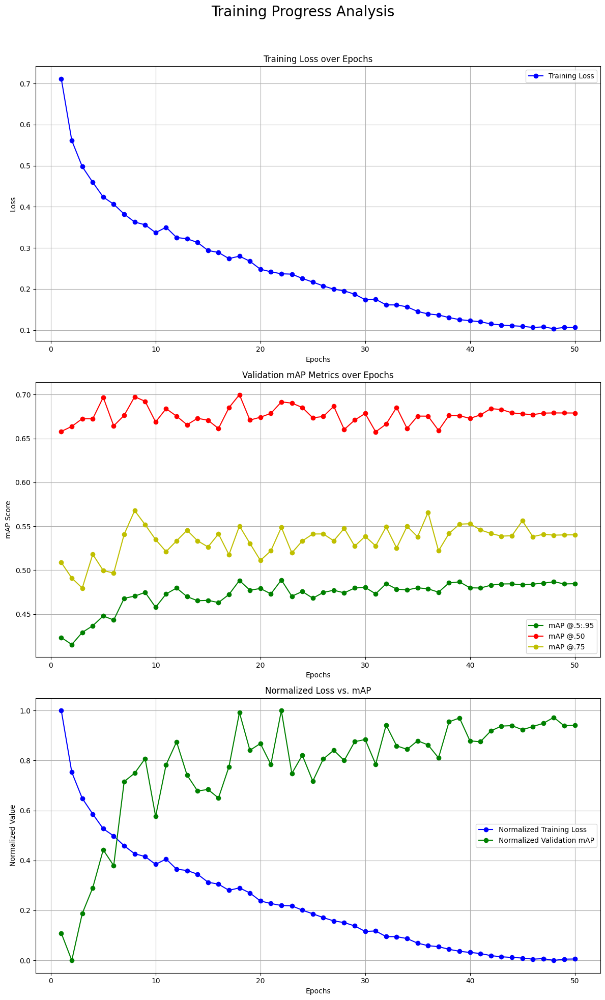

In [ ]:
# --- Training Setup ---
import copy # Import the copy module

# Set training hyperparameters
BEST_MAP = 0.0
MODEL_SAVE_PATH = 'best_vehicle_detector.pth'
HISTORY_SAVE_PATH = 'training_history.json'


# Initialize training history dictionary
training_history = {
    "train_loss": [],
    "val_map": [],
    "val_map_50": [],
    "val_map_75": [],
    "learning_rate": []
}

# To store the best model weights
best_model_weights = None

print("--- Starting Model Training ---")
print(f"Training for {NUM_EPOCHS} epochs on device: {device}")

# --- Main Training Loop ---

# Implement main training loop
total_train_start_time = time.time()

for epoch in range(NUM_EPOCHS):
    epoch_start_time = time.time()

    # --- Train for one epoch ---
    avg_train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)

    # --- Validate the model ---
    val_metrics = validate_model(model, val_loader, device)

    # --- Step the learning rate scheduler ---
    lr_scheduler.step()
    current_lr = optimizer.param_groups[0]['lr']

    # --- Extract metric values ---
    # Convert tensor metrics to float for logging and comparison
    val_map = val_metrics['map'].item()
    val_map_50 = val_metrics['map_50'].item()
    val_map_75 = val_metrics['map_75'].item()

    # --- Update training history ---
    training_history['train_loss'].append(avg_train_loss)
    training_history['val_map'].append(val_map)
    training_history['val_map_50'].append(val_map_50)
    training_history['val_map_75'].append(val_map_75)
    training_history['learning_rate'].append(current_lr)

    epoch_time = time.time() - epoch_start_time

    # --- Print comprehensive epoch results ---
    print(f"\n--- Epoch {epoch+1}/{NUM_EPOCHS} Summary ---")
    print(f"Time: {epoch_time:.2f}s")
    print(f"Learning Rate: {current_lr:.6f}")
    print(f"Train Loss: {avg_train_loss:.4f}")
    print(f"Validation mAP@.5:.95: {val_map:.4f}")
    print(f"Validation mAP@.50:    {val_map_50:.4f}")
    print(f"Validation mAP@.75:    {val_map_75:.4f}")
    print("-" * 30)

    # --- Save best model ---
    if val_map > BEST_MAP:
        BEST_MAP = val_map
        # Use deepcopy to ensure the weights are not a reference
        best_model_weights = copy.deepcopy(model.state_dict())
        torch.save(best_model_weights, MODEL_SAVE_PATH)
        print(f"🎉 New best model saved! mAP: {BEST_MAP:.4f} at epoch {epoch+1}")

total_training_time = time.time() - total_train_start_time
print(f"\n--- Training Complete ---")
print(f"Total Training Time: {total_training_time/60:.2f} minutes")
print(f"Best Validation mAP@.5:.95: {BEST_MAP:.4f}")
print(f"Best model weights saved to: {MODEL_SAVE_PATH}")


# --- Save Final History ---
with open(HISTORY_SAVE_PATH, 'w') as f:
    json.dump(training_history, f, indent=4)
print(f"Training history saved to: {HISTORY_SAVE_PATH}")


# --- Visualization ---

# Create visualization of training progress
def plot_training_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    fig.suptitle('Training Progress Analysis', fontsize=20)

    # Plot 1: Training Loss
    ax1.plot(epochs, history['train_loss'], 'bo-', label='Training Loss')
    ax1.set_title('Training Loss over Epochs')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.grid(True)
    ax1.legend()

    # Plot 2: Validation mAP Metrics
    ax2.plot(epochs, history['val_map'], 'go-', label='mAP @.5:.95')
    ax2.plot(epochs, history['val_map_50'], 'ro-', label='mAP @.50')
    ax2.plot(epochs, history['val_map_75'], 'yo-', label='mAP @.75')
    ax2.set_title('Validation mAP Metrics over Epochs')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('mAP Score')
    ax2.grid(True)
    ax2.legend()

    # Plot 3: Normalized Loss vs. mAP
    # Normalize data to be in the range [0, 1] for comparison
    norm_loss = np.array(history['train_loss'])
    norm_loss = (norm_loss - norm_loss.min()) / (norm_loss.max() - norm_loss.min())

    norm_map = np.array(history['val_map'])
    norm_map = (norm_map - norm_map.min()) / (norm_map.max() - norm_map.min())

    ax3.plot(epochs, norm_loss, 'bo-', label='Normalized Training Loss')
    ax3.plot(epochs, norm_map, 'go-', label='Normalized Validation mAP')
    ax3.set_title('Normalized Loss vs. mAP')
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Normalized Value')
    ax3.grid(True)
    ax3.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

print("\nGenerating training progress plots...")
plot_training_history(training_history)

## 9️⃣ Model Evaluation and Testing

**Task**: Evaluate the trained model on the test set and visualize predictions.

**Requirements**:
- Load the best saved model
- Evaluate on the test set using the same metrics
- Visualize predictions vs ground truth on test images
- Show the effect of different confidence thresholds
- Analyze model performance across different vehicle classes

**Visualization Requirements**:
- Display ground truth boxes in red
- Display predicted boxes in green
- Show confidence scores for predictions
- Compare predictions at different confidence thresholds

In [ ]:
# TODO: Load the best saved model
# Load checkpoint and restore model state_dict

# TODO: Evaluate on test set
# Use validate_model function with test_loader
# Print test set results (mAP@0.5:0.95, mAP@0.5, mAP@0.75)

# TODO: Implement visualize_predictions function:
#       - Set model to evaluation mode
#       - Create 2x3 subplot grid
#       - For each test image:
#         * Generate predictions using model
#         * Filter predictions by confidence threshold
#         * Display original image
#         * Draw ground truth boxes (red) with "GT:" labels
#         * Draw predicted boxes (green) with "Pred:" labels and confidence scores
#         * Set appropriate titles showing object counts

# TODO: Visualize predictions on test indices [0, 5, 10, 15, 20, 25]
# Use confidence threshold 0.5

# TODO: Create confidence threshold comparison
# Show same image with thresholds [0.3, 0.5, 0.7]
# Display in 1x3 subplot showing effect of threshold on detections

# TODO: Print analysis of results and model performance

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth


Loading best model from: best_vehicle_detector.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 119MB/s] 


Model loaded successfully.

--- Evaluating on the Test Set ---


[Validation]:   0%|          | 0/126 [00:00<?, ?it/s]

Computing final mAP...

--- Test Set Results ---
Test mAP@.5:.95: 0.5632
Test mAP@.50:    0.7906
Test mAP@.75:    0.5823
-------------------------

Visualizing predictions on the test set...


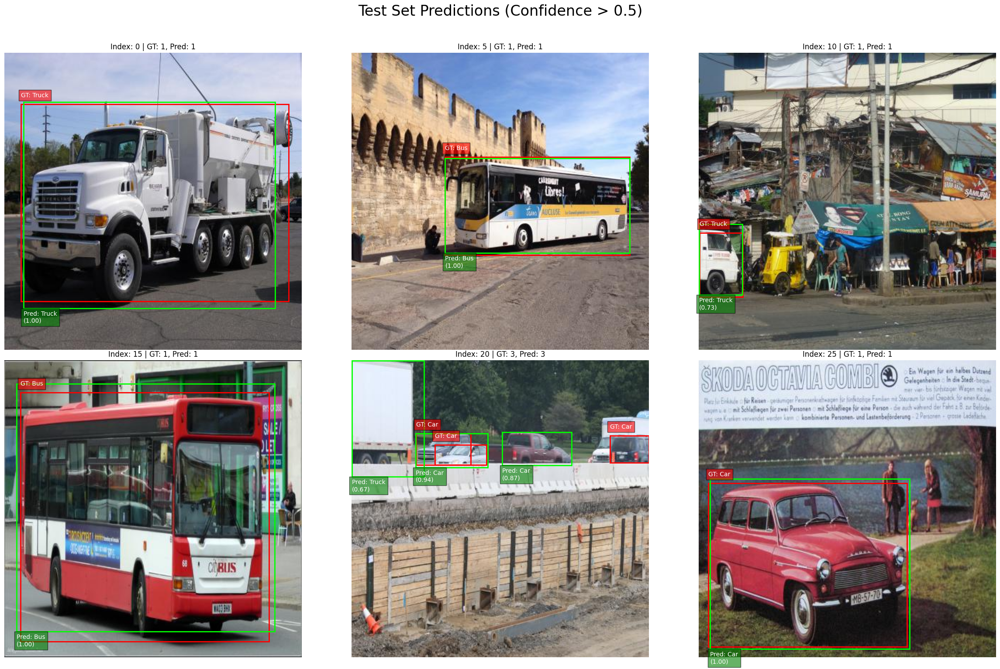


Visualizing the effect of different confidence thresholds...


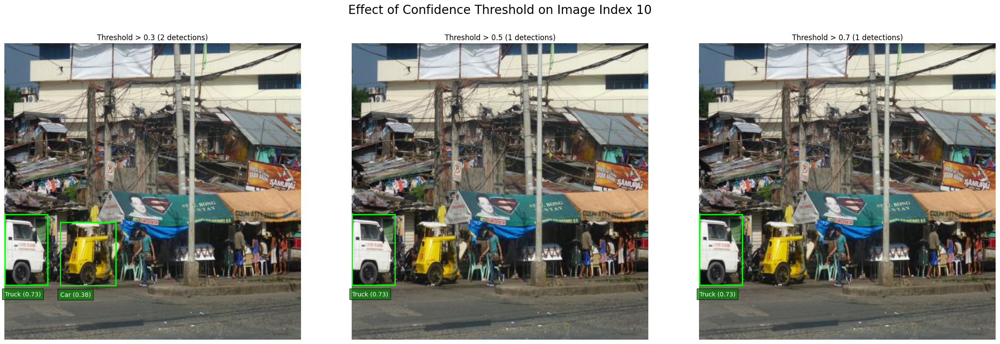

In [ ]:
# --- Setup ---
# Ensure necessary variables from previous steps are available:
# device, test_loader, test_dataset, VEHICLE_CLASS_NAMES, CLASS_COLORS

CONF_THRESHOLD = 0.5
MODEL_PATH = 'best_vehicle_detector.pth'

# --- Load the Best Saved Model ---
print(f"Loading best model from: {MODEL_PATH}")

# First, re-create the model architecture
# same architecture as the one that was trained
model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(weights=None)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES)

# Now, load the saved weights (state_dict)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
print("Model loaded successfully.")

# --- Evaluate on the Test Set ---
print("\n--- Evaluating on the Test Set ---")
# We can reuse the validate_model function as it's designed for evaluation
test_metrics = validate_model(model, test_loader, device)

test_map = test_metrics['map'].item()
test_map_50 = test_metrics['map_50'].item()
test_map_75 = test_metrics['map_75'].item()

print(f"\n--- Test Set Results ---")
print(f"Test mAP@.5:.95: {test_map:.4f}")
print(f"Test mAP@.50:    {test_map_50:.4f}")
print(f"Test mAP@.75:    {test_map_75:.4f}")
print("-" * 25)


# --- Visualize Predictions ---

def visualize_predictions(model, dataset, indices, threshold=0.5, title="Model Predictions"):
    """
    Visualizes model predictions against ground truth for selected samples.
    """
    model.eval()
    fig, axes = plt.subplots(2, 3, figsize=(24, 16))
    fig.suptitle(title, fontsize=24, y=0.95)
    axes = axes.ravel()

    for i, idx in enumerate(indices):
        ax = axes[i]
        image_tensor, target = dataset[idx]

        # Get model prediction
        with torch.no_grad():
            prediction = model([image_tensor.to(device)])[0]

        # Convert tensor image to PIL for display
        pil_image = F.to_pil_image(image_tensor)
        ax.imshow(pil_image)

        gt_count = len(target['boxes'])
        pred_count = 0

        # Draw Ground Truth boxes (in red)
        for box, label_id in zip(target['boxes'], target['labels']):
            xmin, ymin, xmax, ymax = box
            class_name = VEHICLE_CLASS_NAMES.get(label_id.item(), 'N/A')
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, lw=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin - 10, f"GT: {class_name}", color='white', bbox=dict(facecolor='red', alpha=0.6))

        # Draw Predicted boxes (in green) that are above the threshold
        for box, label_id, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
            if score > threshold:
                pred_count += 1
                xmin, ymin, xmax, ymax = box.cpu().numpy()
                class_name = VEHICLE_CLASS_NAMES.get(label_id.item(), 'N/A')
                color = CLASS_COLORS.get(class_name, 'gray')
                rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, lw=2, edgecolor='lime', facecolor='none')
                ax.add_patch(rect)
                ax.text(xmin, ymax + 20, f"Pred: {class_name}\n({score:.2f})", color='white', bbox=dict(facecolor='green', alpha=0.6))

        ax.set_title(f"Index: {idx} | GT: {gt_count}, Pred: {pred_count}")
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

# Visualize predictions on test indices
print("\nVisualizing predictions on the test set...")
test_indices = [0, 5, 10, 15, 20, 25]
visualize_predictions(model, test_dataset, test_indices, threshold=CONF_THRESHOLD, title=f"Test Set Predictions (Confidence > {CONF_THRESHOLD})")


# --- Confidence Threshold Comparison ---

# Create confidence threshold comparison
def compare_confidence_thresholds(model, dataset, index):
    """Shows the effect of different confidence thresholds on a single image."""
    model.eval()
    thresholds = [0.3, 0.5, 0.7]
    fig, axes = plt.subplots(1, 3, figsize=(24, 8))
    fig.suptitle(f"Effect of Confidence Threshold on Image Index {index}", fontsize=20)

    image_tensor, _ = dataset[index]
    with torch.no_grad():
        prediction = model([image_tensor.to(device)])[0]

    for i, threshold in enumerate(thresholds):
        ax = axes[i]
        pil_image = F.to_pil_image(image_tensor)
        ax.imshow(pil_image)

        pred_count = 0
        for box, label_id, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
            if score > threshold:
                pred_count += 1
                xmin, ymin, xmax, ymax = box.cpu().numpy()
                class_name = VEHICLE_CLASS_NAMES.get(label_id.item(), 'N/A')
                rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, lw=2, edgecolor='lime', facecolor='none')
                ax.add_patch(rect)
                ax.text(xmin, ymax + 15, f"{class_name} ({score:.2f})", color='white', bbox=dict(facecolor='green', alpha=0.7))

        ax.set_title(f"Threshold > {threshold} ({pred_count} detections)")
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.94])
    plt.show()

print("\nVisualizing the effect of different confidence thresholds...")
compare_confidence_thresholds(model, test_dataset, index=10)


Number of feature maps from backbone: 256


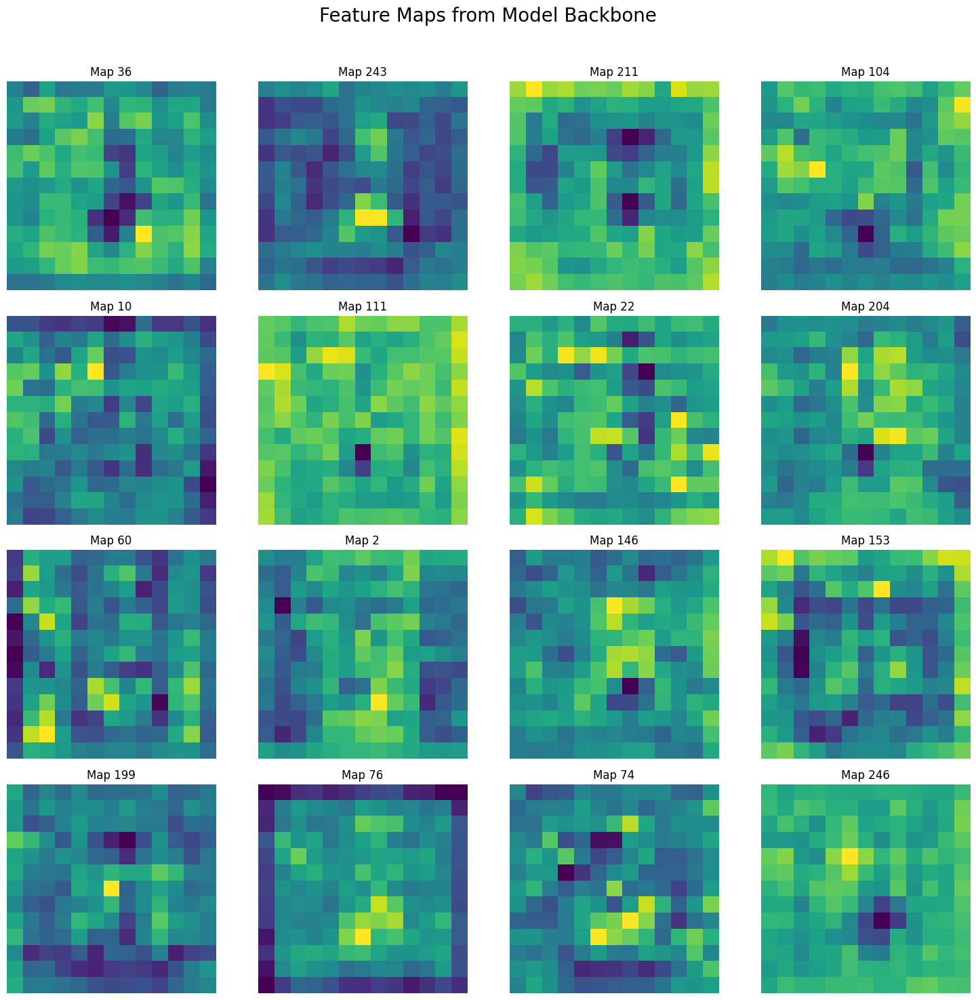

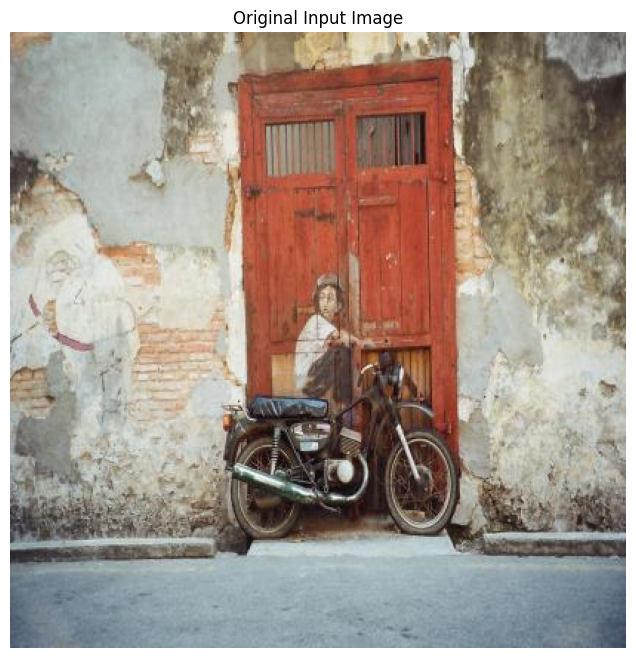

In [ ]:
import random
import torchvision.transforms as T

# --- Define a Hook to Capture Feature Maps ---
feature_maps = {}

def get_feature_maps(name):
    def hook(model, input, output):
        # The output of the backbone is an ordered dict. We are interested
        # in the tensor output, not the dict itself. We'll grab the last one.
        last_key = list(output.keys())[-1]
        feature_maps[name] = output[last_key].detach()
    return hook

# --- Register the Hook on a Backbone Layer ---
# We will attach the hook to the final layer of the MobileNetV3 backbone.
# This will show us the high-level features the model uses before the RPN and classification head.
layer_to_visualize = model.backbone
handle = layer_to_visualize.register_forward_hook(get_feature_maps('backbone'))


# --- Process an Image and Visualize ---
# Get a random image from the test set
img, target = random.choice(test_dataset)
input_tensor = img.unsqueeze(0).to(device) # Add batch dimension and send to device

# Run the image through the model to trigger the hook
model.eval()
with torch.no_grad():
    output = model(input_tensor)

# Detach the handle now that we have our feature maps
handle.remove()

# Get the feature maps from our dictionary
maps = feature_maps['backbone'].squeeze(0)
# Move to cpu for plotting
maps_cpu = maps.cpu()

print(f"Number of feature maps from backbone: {maps_cpu.shape[0]}")

# --- Plot the Maps ---
# We will plot a few random feature maps
num_maps_to_plot = 16
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
fig.suptitle('Feature Maps from Model Backbone', fontsize=20)

# Get the original image for comparison
original_img = T.ToPILImage()(img)

for i, ax in enumerate(axes.flat):
    if i < num_maps_to_plot:
        # Pick a random map index
        map_idx = random.randint(0, maps_cpu.shape[0] - 1)

        # Plot the feature map
        ax.imshow(maps_cpu[map_idx], cmap='viridis')
        ax.set_title(f"Map {map_idx}")
        ax.axis('off')
    else:
        ax.axis('off') # Hide unused subplots

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Also show the original image
plt.figure(figsize=(8,8))
plt.imshow(original_img)
plt.title("Original Input Image")
plt.axis('off')
plt.show()

## 📝 Evaluation Criteria

Your homework will be evaluated based on:

### 1. Implementation Correctness (40%)
- **Dataset Loading**: Proper COCO format parsing and PyTorch dataset implementation
- **Model Architecture**: Correct Faster R-CNN setup with transfer learning
- **Training Loop**: Working training and validation with appropriate loss handling
- **Evaluation**: Proper mAP computation and metric tracking

### 2. Training and Results (30%)
- **Model Training**: Successful training without errors
- **Convergence**: Reasonable loss curves and metric improvement
- **Performance**: Achieving meaningful detection results on test set
- **Hyperparameters**: Appropriate choice of learning rate, batch size, etc.

### 3. Code Quality and Documentation (30%)
- **Code Structure**: Clean, readable code with proper organization
- **Comments**: Adequate documentation explaining key steps
- **Error Handling**: Robust implementation handling edge cases
- **Efficiency**: Reasonable computational complexity